In [5]:
!pip install -q bitsandbytes datasets accelerate loralib gradio
!pip install -q git+https://github.com/huggingface/transformers.git@main git+https://github.com/huggingface/peft.git
!pip install sentencepiece

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.8/19.8 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.8/288.8 kB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 5.7 MB/s eta 0:

# WHY PEFT?
Problem with training large language models and fine tuning them is The llm’s are computationally very expensive and Their file size becomes very huge as they have billions of parameters with huge weights.

To solve these problems the idea of parameter efficient fine tuning comes into picture.PEFT uses a variety of fine tuning techniques but for now lets concentrate on LORA (Low Rank Adaptation Of Large Language Models).

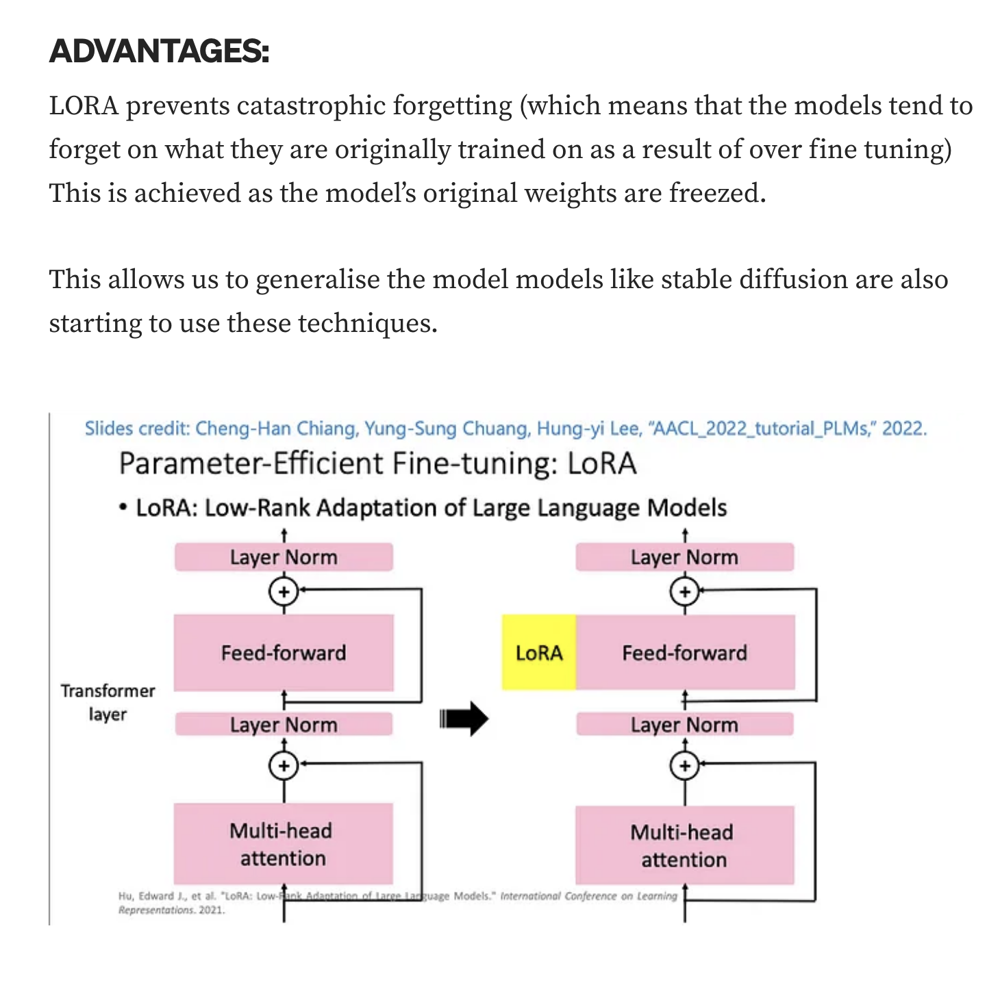

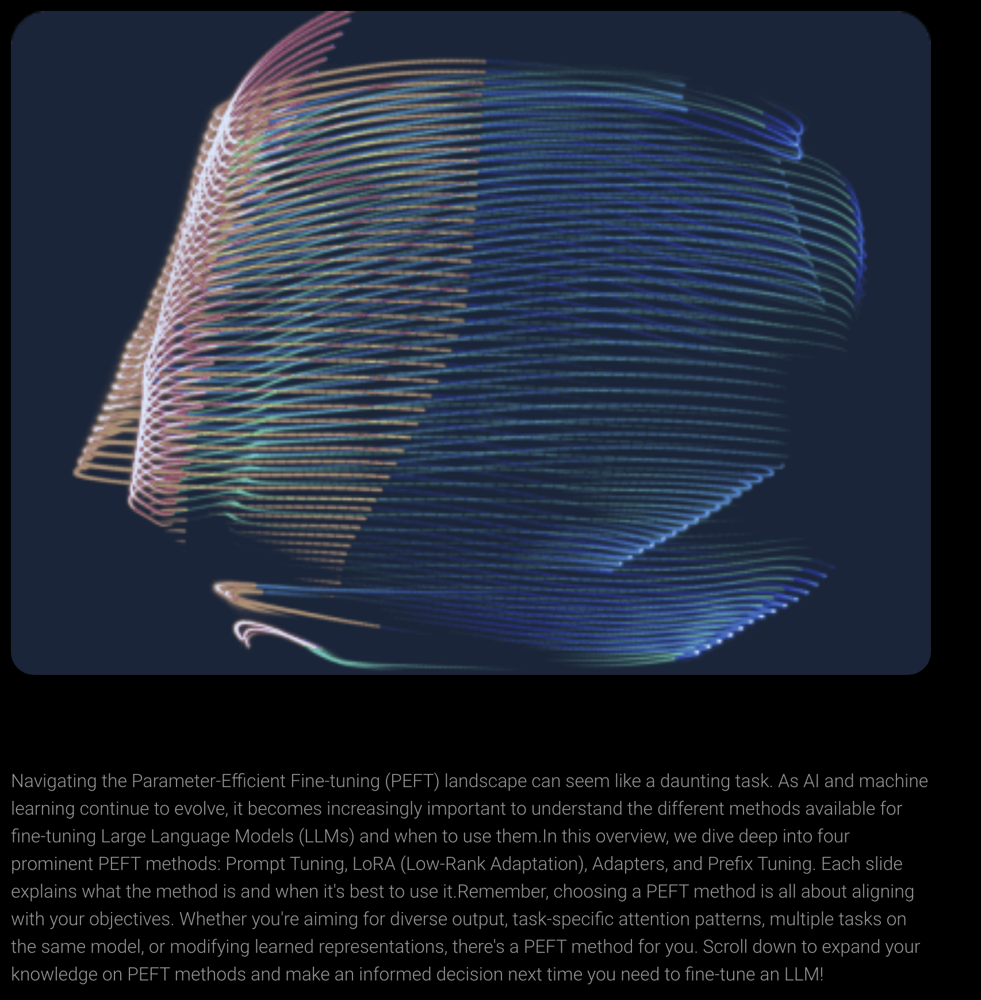

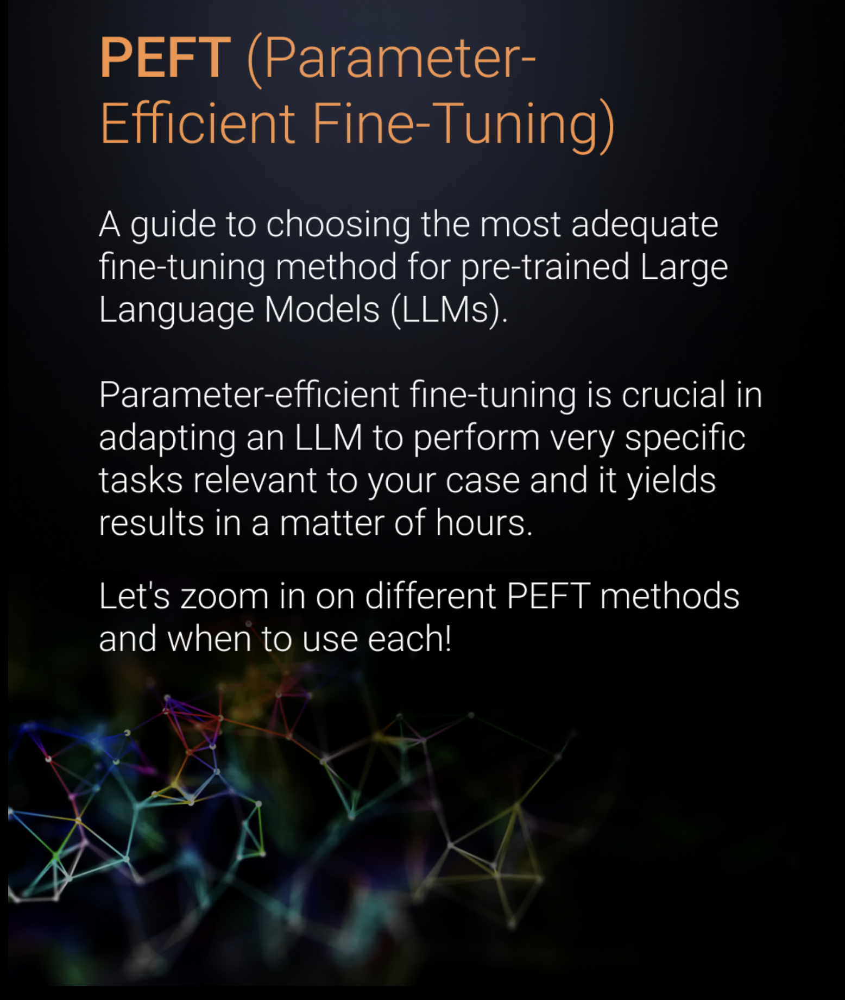

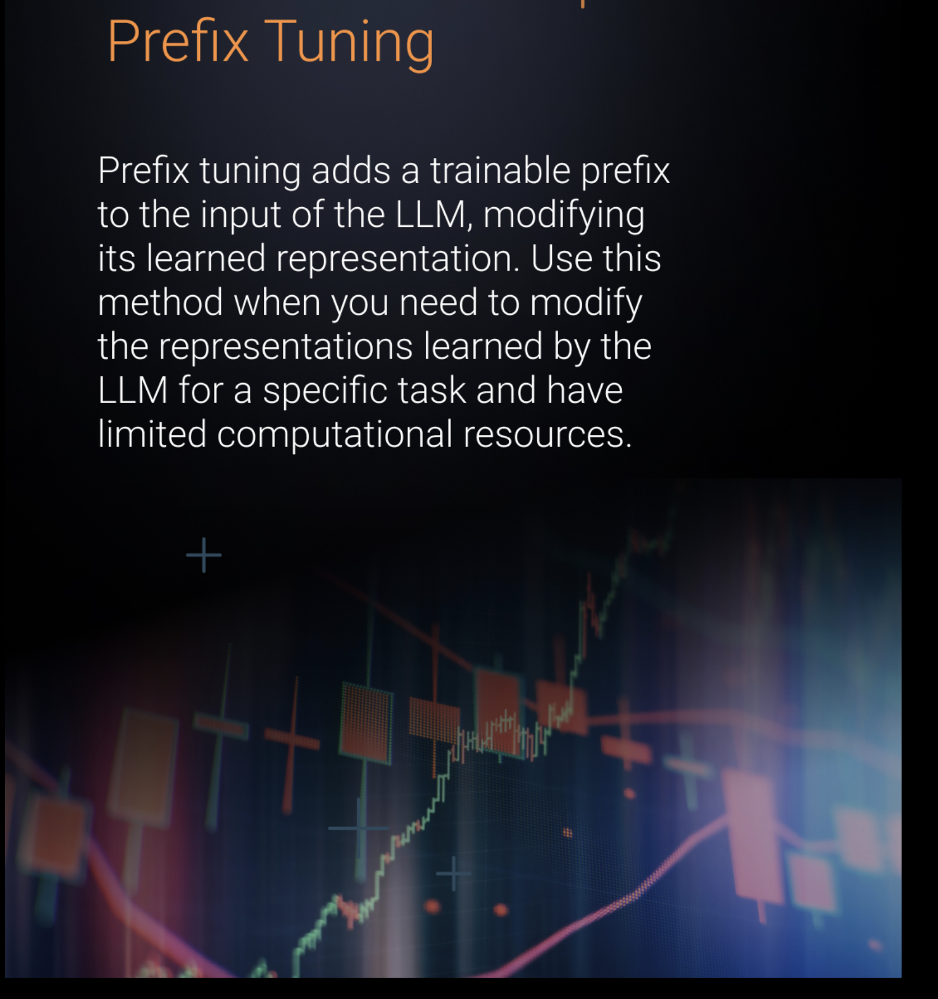

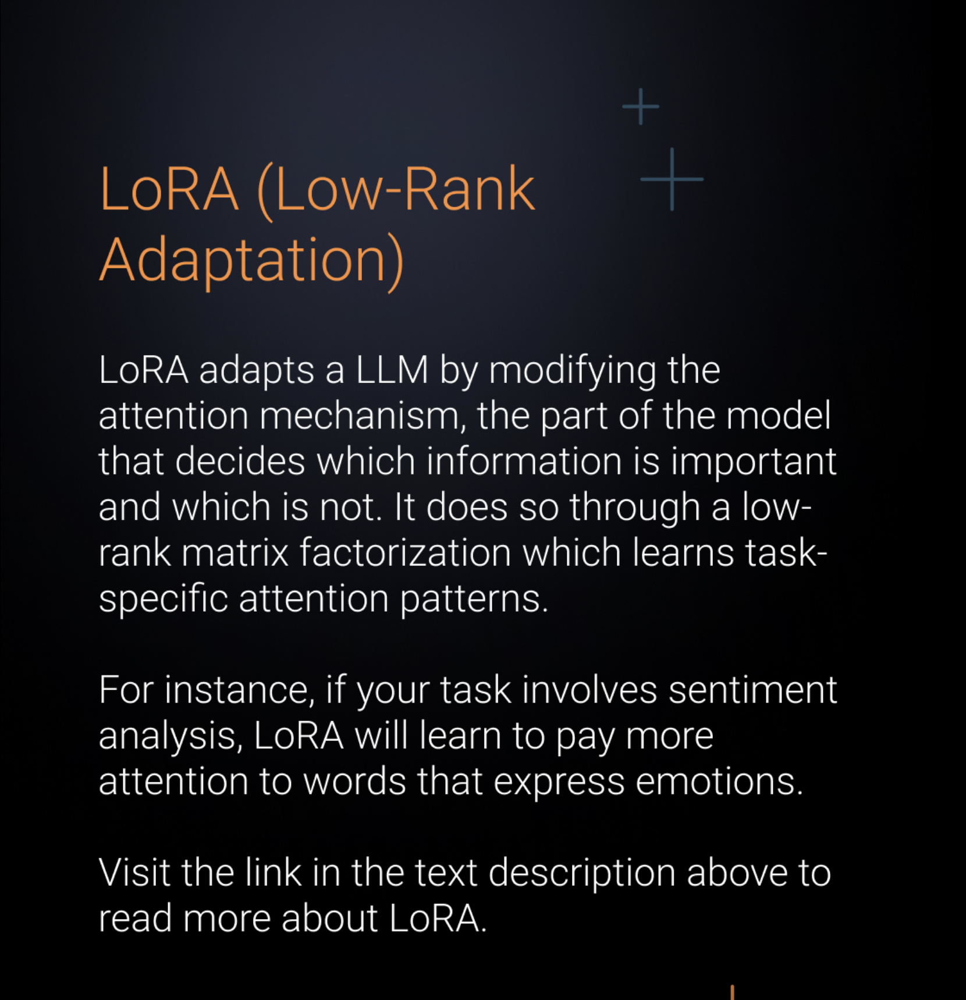

# QLoRA
QLoRA, which stands for “Quantized Low-Rank Adaptation,” presents an approach that combines quantization and low-rank adaptation to achieve efficient fine-tuning of AI models. Both these terms are explained in more detail below.

QLoRA reduces the memory required for fine-tuning LLM, without any drop in performance with respect to a standard 16-bit model fine-tuned model. This method enables a 7 billion parameter model to be fine-tuned on a 16GB GPU, a 33 billion parameter model to be fine-tuned on a single 24GB GPU and a 65 billion parameter model to be fine-tuned on a single 46GB GPU.

This implies most companies can now have fine-tuned LLMs or on-prem models for a small cost.

QLoRA is composed of two techniques:

Lora — Low-Rank Adaptation
Quantization

In [2]:
import transformers
import accelerate
import peft

print(f"Transformers version: {transformers.__version__}")
print(f"Accelerate version: {accelerate.__version__}")
print(f"PEFT version: {peft.__version__}")
"Transformers version: 4.27.4"
"Accelerate version: 0.18.0"
"PEFT version: 0.2.0"


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /usr/local/lib/python3.10/dist-packages/bitsandbytes/libbitsandbytes_cuda118.so
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: CUDA runtime path found: /usr/local/cuda/lib64/libcudart.so
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 118
CUDA SETUP: Loading binary /usr/local/lib/python3.10/dist-packages/bitsandbytes/libbitsandbytes_cuda118.so...


/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/lib64-nvidia did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/sys/fs/cgroup/memory.events /var/colab/cgroup/jupyter-children/memory.events')}
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('http'), PosixPath('//172.28.0.1'), PosixPath('8013')}
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('--logtostderr --listen_host=172.28.0.12 --

Transformers version: 4.31.0.dev0
Accelerate version: 0.21.0
PEFT version: 0.4.0.dev0


'PEFT version: 0.2.0'

In [17]:
from huggingface_hub import notebook_login

notebook_login()

In [4]:
# import torch
# from peft import PeftModel
# from transformers import LlamaTokenizer, LlamaForCausalLM
# from transformers import AutoTokenizer, AutoModelForCausalLM

# def load_model(base, finetuned, multi_gpu):
#     tokenizer = AutoTokenizer.from_pretrained(base)
#     # tokenizer.pad_token_id = 0
#     tokenizer.padding_side = "left"

#     if not multi_gpu:
#         model = AutoModelForCausalLM.from_pretrained(
#             base,
#             load_in_8bit=True,
#             device_map="auto",
#         )

#         model = PeftModel.from_pretrained(
#             model, finetuned, device_map={'': 0}
#         )
#         return model, tokenizer
#     else:
#         model = AutoModelForCausalLM.from_pretrained(
#             base,
#             torch_dtype=torch.float16,
#             device_map="auto",
#         )

#         model = PeftModel.from_pretrained(
#             model, finetuned, torch_dtype=torch.float16
#         )
#         model.half()
#         return model, tokenizer

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import torch
import torch.nn as nn
import bitsandbytes as bnb
from transformers import AutoTokenizer, AutoConfig, AutoModelForCausalLM

model = AutoModelForCausalLM.from_pretrained(
    "bigscience/bloom-560m",
    load_in_8bit=True,
    device_map='auto',
)

tokenizer = AutoTokenizer.from_pretrained("bigscience/bloom-7b1")


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /usr/local/lib/python3.10/dist-packages/bitsandbytes/libbitsandbytes_cuda118.so
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: CUDA runtime path found: /usr/local/cuda/lib64/libcudart.so
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 118
CUDA SETUP: Loading binary /usr/local/lib/python3.10/dist-packages/bitsandbytes/libbitsandbytes_cuda118.so...


/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/lib64-nvidia did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/sys/fs/cgroup/memory.events /var/colab/cgroup/jupyter-children/memory.events')}
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('//172.28.0.1'), PosixPath('http'), PosixPath('8013')}
  warn(msg)
/usr/local/lib/python3.10/dist-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('//colab.research.google.com/tun/m/cc483011

Some weights of BloomForCausalLM were not initialized from the model checkpoint at bigscience/bloom-560m and are newly initialized: ['lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


# Freezing the original weights

In [2]:
for param in model.parameters():
  param.requires_grad = False  # freeze the model - train adapters later
  if param.ndim == 1:
    # cast the small parameters (e.g. layernorm) to fp32 for stability
    param.data = param.data.to(torch.float32)

model.gradient_checkpointing_enable()  # reduce number of stored activations
model.enable_input_require_grads()

class CastOutputToFloat(nn.Sequential):
  def forward(self, x): return super().forward(x).to(torch.float32)
model.lm_head = CastOutputToFloat(model.lm_head)

# Setting up the LoRa Adapters

In [3]:
def print_trainable_parameters(model):
    """
    Prints the number of trainable parameters in the model.
    """
    trainable_params = 0
    all_param = 0
    for _, param in model.named_parameters():
        all_param += param.numel()
        if param.requires_grad:
            trainable_params += param.numel()
    print(
        f"trainable params: {trainable_params} || all params: {all_param} || trainable%: {100 * trainable_params / all_param}"
    )

In [4]:
from peft import LoraConfig, get_peft_model

config = LoraConfig(
    r=16, #attention heads
    lora_alpha=32, #alpha scaling
    # target_modules=["q_proj", "v_proj"], #if you know the
    lora_dropout=0.05,
    bias="none",
    task_type="CAUSAL_LM" # set this for CLM or Seq2Seq
)

model = get_peft_model(model, config)
print_trainable_parameters(model)

trainable params: 1572864 || all params: 560787456 || trainable%: 0.2804741766549072


#DATA

In [5]:
import transformers
from datasets import load_dataset
data = load_dataset("Abirate/english_quotes")

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset json downloaded and prepared to /root/.cache/huggingface/datasets/Abirate___json/Abirate--english_quotes-6e72855d06356857/0.0.0/8bb11242116d547c741b2e8a1f18598ffdd40a1d4f2a2872c7a28b697434bc96. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
data

DatasetDict({
    train: Dataset({
        features: ['quote', 'author', 'tags'],
        num_rows: 2508
    })
})

In [7]:
def merge_columns(example):
    example["prediction"] = example["quote"] + " ->: " + str(example["tags"])
    return example

data['train'] = data['train'].map(merge_columns)
data['train']["prediction"][:5]

Map:   0%|          | 0/2508 [00:00<?, ? examples/s]

["“Be yourself; everyone else is already taken.” ->: ['be-yourself', 'gilbert-perreira', 'honesty', 'inspirational', 'misattributed-oscar-wilde', 'quote-investigator']",
 "“I'm selfish, impatient and a little insecure. I make mistakes, I am out of control and at times hard to handle. But if you can't handle me at my worst, then you sure as hell don't deserve me at my best.” ->: ['best', 'life', 'love', 'mistakes', 'out-of-control', 'truth', 'worst']",
 "“Two things are infinite: the universe and human stupidity; and I'm not sure about the universe.” ->: ['human-nature', 'humor', 'infinity', 'philosophy', 'science', 'stupidity', 'universe']",
 "“So many books, so little time.” ->: ['books', 'humor']",
 "“A room without books is like a body without a soul.” ->: ['books', 'simile', 'soul']"]

In [8]:
data['train'][0]

{'quote': '“Be yourself; everyone else is already taken.”',
 'author': 'Oscar Wilde',
 'tags': ['be-yourself',
  'gilbert-perreira',
  'honesty',
  'inspirational',
  'misattributed-oscar-wilde',
  'quote-investigator'],
 'prediction': "“Be yourself; everyone else is already taken.” ->: ['be-yourself', 'gilbert-perreira', 'honesty', 'inspirational', 'misattributed-oscar-wilde', 'quote-investigator']"}

In [9]:
data = data.map(lambda samples: tokenizer(samples['prediction']), batched=True)

Map:   0%|          | 0/2508 [00:00<?, ? examples/s]

In [10]:
data

DatasetDict({
    train: Dataset({
        features: ['quote', 'author', 'tags', 'prediction', 'input_ids', 'attention_mask'],
        num_rows: 2508
    })
})

In [11]:
trainer = transformers.Trainer(
    model=model,
    train_dataset=data['train'],
    args=transformers.TrainingArguments(
        per_device_train_batch_size=4,
        gradient_accumulation_steps=4,
        warmup_steps=100,
        max_steps=200,
        learning_rate=2e-4,
        fp16=True,
        logging_steps=1,
        output_dir='outputs'
    ),
    data_collator=transformers.DataCollatorForLanguageModeling(tokenizer, mlm=False)
)
model.config.use_cache = False  # silence the warnings. Please re-enable for inference!
trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a BloomTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
/usr/local/lib/python3.10/dist-packages/bitsandbytes/autograd/_functions.py:322: UserWarning: MatMul8bitLt: inputs will be cast from torch.float32 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")


Step,Training Loss
1,3.623000
2,3.722200
3,3.741700
4,4.016200
5,3.913300
6,4.158300
7,3.576700
8,3.692200
9,4.016600
10,3.706000


TrainOutput(global_step=200, training_loss=2.8932031488418577, metrics={'train_runtime': 435.9029, 'train_samples_per_second': 7.341, 'train_steps_per_second': 0.459, 'total_flos': 663257454772224.0, 'train_loss': 2.8932031488418577, 'epoch': 1.28})

In [18]:
model.push_to_hub("Andyrasika/bloom-560m-lora-tagger")

CommitInfo(commit_url='https://huggingface.co/Andyrasika/bloom-560m-lora-tagger/commit/bb16c2e24319972829d7ef6e2a7a7d9019c291e7', commit_message='Upload model', commit_description='', oid='bb16c2e24319972829d7ef6e2a7a7d9019c291e7', pr_url=None, pr_revision=None, pr_num=None)

In [19]:
import torch
from peft import PeftModel, PeftConfig
from transformers import AutoModelForCausalLM, AutoTokenizer

peft_model_id = "Andyrasika/bloom-560m-lora-tagger"
config = PeftConfig.from_pretrained(peft_model_id)
model = AutoModelForCausalLM.from_pretrained(config.base_model_name_or_path, return_dict=True, load_in_8bit=True, device_map='auto')
tokenizer = AutoTokenizer.from_pretrained(config.base_model_name_or_path)

# Load the Lora model
model = PeftModel.from_pretrained(model, peft_model_id)

Some weights of BloomForCausalLM were not initialized from the model checkpoint at bigscience/bloom-560m and are newly initialized: ['lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [20]:
batch = tokenizer("“Training models with PEFT and LoRa is cool” ->: ", return_tensors='pt')

with torch.cuda.amp.autocast():
  output_tokens = model.generate(**batch, max_new_tokens=50)

print('\n\n', tokenizer.decode(output_tokens[0], skip_special_tokens=True))

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1468: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/bitsandbytes/autograd/_functions.py:322: UserWarning: MatMul8bitLt: inputs will be cast from torch.float32 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")




 “Training models with PEFT and LoRa is cool” ->:  ['training', 'roaming', 'telecommunication']
“If you want to be a good person, you have to be a good person.” ->:  ['the-goodness-of-person']
“If
